In [13]:
library(raster)
library(repr)
library(MASS)

library("data.table") 
source("../libs/return_multiple_from_functions.r")
source('../../gitProjectExtras/gitBasedProjects/R/sourceAllLibs.r')

sourceAllLibs(trace = FALSE)
sourceAllLibs('../../gitProjectExtras/gitBasedProjects/R', trace = FALSE)
sourceAllLibs('../libs/', trace = FALSE)

library(raster)
library(ncdf4)
#library(rasterExtras)
#library(rasterPlot)
library(plotrix)
library(mapdata)
library(mapplots)
library(ellipse)

sourceAllLibs('../../rasterextrafuns/rasterPlotFunctions/R/', trace = FALSE)
sourceAllLibs('../../rasterextrafuns/rasterExtras/R/', trace = FALSE)

In [14]:
reds9 = c('#FFFBF7', '#F7EBDE', '#EFDBC6', '#E1CA9E', '#D6AE6B', '#C69242', '#B57121', '#9C5108', '#6B3008')

In [31]:
climate_files = c(tas  = "../../savanna_fire_feedback_test/data/driving_Data_global_new/GDD0.nc",
                  tree = "../../savanna_fire_feedback_test/data/driving_Data/TreeCover.nc",
                  noneTree = "../../savanna_fire_feedback_test/data/driving_Data/nonTreeCover.nc",
                  height = "../data/height_Simard.nc")

cols = list(rev(c('#d73027','#fc8d59','#fee090','#ffffbf','#e0f3f8','#91bfdb','#4575b4')),
            c('#f7fcf5','#e5f5e0','#c7e9c0','#a1d99b','#74c476','#41ab5d','#238b45','#006d2c','#00441b'),
            c('#ffffd9','#edf8b1','#c7e9b4','#7fcdbb','#41b6c4','#1d91c0','#225ea8','#253494','#081d58'))
limits = list(c(10, 100, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000), #c(10, 12, 14, 16, 18, 20, 22, 24, 26, 28)
              c(0.2, 0.4, 0.6, 0.8, 0.9, 0.95, 0.99),
              c(0, 5, 10, 20, 15, 20, 25, 30, 35))

species_files = '../data/speciesDis/'

x_range = c(-90, -30)
y_range = c(-55, 15)

load climate data

In [32]:
openRaster <- function(...) {
    dat = raster(...)
    dat = raster::crop(dat, extent(c(x_range, y_range)))
    return(dat)
}
clims = suppressWarnings(lapply(climate_files, openRaster))
clims = list(tas = clims[[1]], fpc = clims[[2]] + clims[[3]], height = clims[[4]])


In [33]:
mask = clims[[1]]
mask[] = 0
for (clim in clims) mask[is.na(clim)] = 1
mask = !mask


load species

In [34]:
files = list.files(species_files)
files = files[grepl('.csv', files)]
names = substr(files, 1, nchar(files) - 5)
specs = lapply(paste0(species_files, '/', files), fread, 
              select=c("decimalLongitude", "decimalLatitude"))

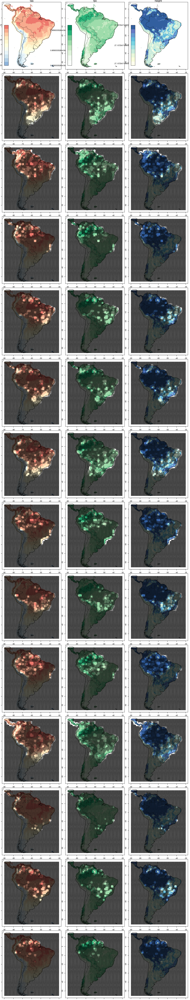

In [35]:
options(repr.plot.width=4*length(clims), repr.plot.height=4.5*(length(specs)+1))
layout(t(matrix(1:(length(clims)*(length(specs)+1)), nrow = length(clims))))
par(mar = rep(1, 4))

plotClimDis <- function(clim, name, col, lim, spec = NULL) {
    if (is.null(spec)) {
        e = NULL; limitsR = 9E9
        out = clim[mask]
    } else {
        blankR = clim
        blankR[] = 0
        cells = cellFromXY(blankR, spec)
        out = clim[cells]
        cells = table(cells)
        count = cells; cells = as.numeric(names(cells))
        blankR[cells] = blankR[cells] + count
        e = raster::aggregate(blankR, fact = 3)
        limitsR = quantile(e[e > 0], seq(0, 0.8, 0.2))

    }
    plot(0, xlab = '', ylab = '', type = 'n', xlim = x_range, ylim = y_range)
    
    plot_raster_from_raster(clim, x_range = c(-90, -30), y_range = c(-55, 15), cols = col, limits = lim, quick = TRUE,
                       add_legend = FALSE, e = e, limits_error = limitsR,
                       PatternRes = 50, ePatternThick = 0.01, e_polygon = FALSE, add = TRUE)
    mtext(name)
    if (is.null(spec)) 
        suppressWarnings(
            add_raster_legend2(clim, cols = col, limits = lim, add = TRUE, plot_loc = c(0.6, 1.3, -0.41, -0.38)))
    
    return(out)
}



outC = mapply(plotClimDis, clims, names(clims),cols, limits)
plotFindDis <-function(spec) 
    out = suppressWarnings(mapply(plotClimDis, clims, '', cols, limits, MoreArgs = list(spec = spec)))

specClims = lapply(specs, plotFindDis)

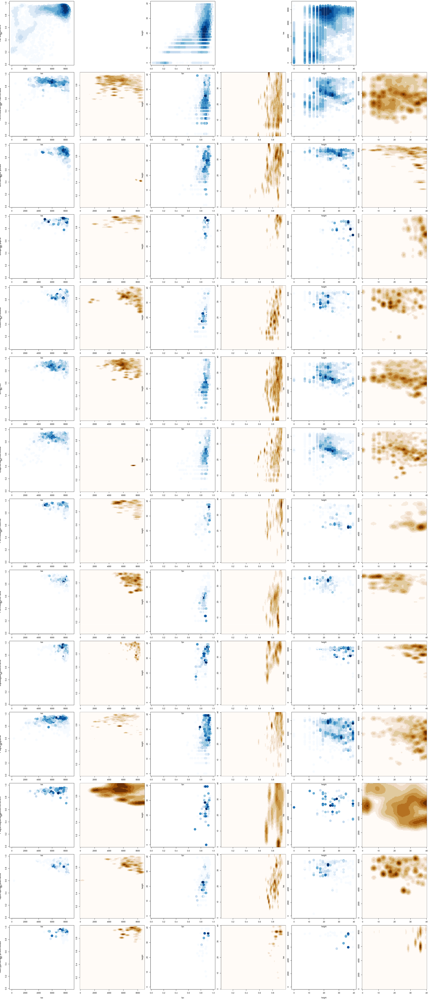

In [36]:
plot4Spec <- function(specClim, name, bgcs = list(NULL, NULL, NULL)) {
    Env4Clim <- function(i, j, np) {
        
        x = specClim[,i]; y = specClim[,j]; bgc = bgcs[[np]]
        maski = !is.na(x + y) & (y < max(y, na.rm = TRUE)) & x < max(x, na.rm = TRUE)
        x = x[maski]; y = y[maski]
        
        cols = blues9[unlist(mapply(rep, 1:9, 9 + (1:9)^2))]
        cols = densCols(x, y, colramp = colorRampPalette(cols))
        
        xr = range(clims[[i]][], na.rm = TRUE); yr = range(clims[[j]][], na.rm = TRUE)
        
        plot(y~x, pch = 19, col = cols, cex = 2.5, xlab = names(clims)[i], ylab = names(clims)[j],
             xlim = xr, ylim = yr, xpd = NA)
        
        if (np == 1) mtext(name, side = 2, line = 3.5)
        sdm = kde2d(x, y, n = 100, lim = c(xr, yr))
        
        if (is.null(bgc)) plot.new()
        else {
            sdm[[3]] = (sdm[[3]]/bgc[[3]])
            cols = reds9[unlist(mapply(rep, 1:9, 9 + (1:9)^3))]
            image(sdm, col = cols)
        }
        return(sdm)
    }
    
    out = list(Env4Clim(1, 2, 1), Env4Clim(2, 3, 2), Env4Clim(3, 1, 3))
    return(out)
}
options(repr.plot.width=8*(length(clims)), repr.plot.height=4*(length(specs)+1))

layout(t(matrix(1:(length(clims)*(2*(length(specs)+1))), nrow = 2*length(clims))))
par(mar = c(2.5, 2, 0.5, 0.5), oma = c(2, 2, 0, 0))
bgcs = plot4Spec(outC, 'All Continent')
sdms = mapply(plot4Spec, specClims, names, MoreArgs = list(bgcs = bgcs), SIMPLIFY = FALSE)


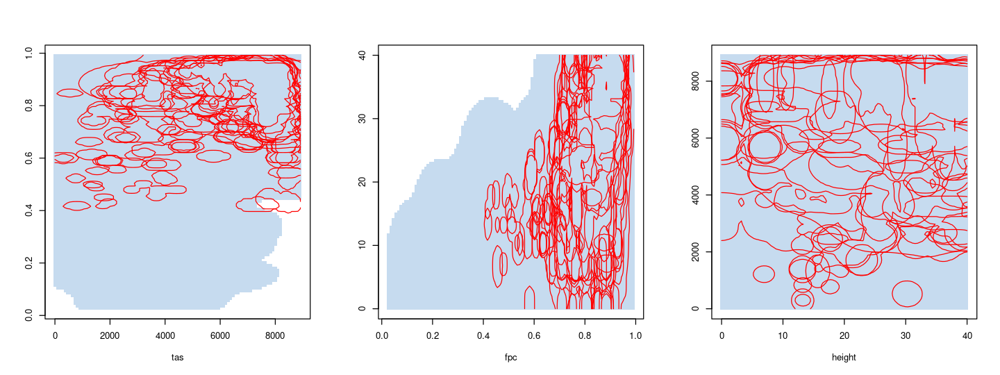

In [37]:
options(repr.plot.width=4*length(clims), repr.plot.height=4.5)
layout(t(matrix(1:(length(clims)), nrow = length(clims))))
overlaySpecies <- function(i, j, np) {
    bgc = bgcs[[np]]
    plot(0, type = 'n', xlab = names(clims)[i], ylab = names(clim)[2],
        xlim = range(clims[[i]][], na.rm = TRUE), ylim = range(clims[[j]][], na.rm = TRUE))
    
    addSDM <- function(sdm)
        contour(sdm[[np]], levels = c(0.005), add  = TRUE, drawlabels = FALSE, col = 'red')

    #bgc[[3]] = bgc[[3]] > 0
    image(bgc, col = c("white", blues9[3]), breaks = c(0, 0.0000000001, 1), add = TRUE)
    nn=lapply(sdms, addSDM)
}
overlaySpecies(1, 2, 1)
overlaySpecies(2, 3, 2)
overlaySpecies(3, 1, 3)

In [39]:
den = 21
lims = apply(outC, 2, function(i) seq(min(i), max(i), length.out = den + 1))

outDir = "../outputs/bcObs-den/"
makeDir(outDir)
deb4BC <- function(bc, name, mask = NULL) {
    bc = bc[!apply(bc, 1, function(i) any(is.na(i))),]
    outFile = paste0(outDir, name, "-gdd-", den, ".Rd")
    print(outFile)
    if (file.exists(outFile)) {
        load(outFile)
        return(dmat)
    }
    varDen <- function(ijk, dmat, bc) {
        if (!is.null(mask) && mask[ijk[1], ijk[2], ijk[3]]) return(dmat)
        inLim <- function(i) {
            id = ijk[i] + c(0, 1)
            lim = lims[id,i]
            out = bc[,i] > lim[1] & lim[2] > bc[,i]
            #rep(TRUE, length(out))
        }
        test = sapply(1:3, inLim)    
        dmat[ijk[1], ijk[2], ijk[3]] = sum(apply(test, 1, all))        
        return(dmat)
    }
                   
    
    dmat = array(0, dim = rep(den-1, ncol(outC)))

    index = 1:(den-1)
    for (i in index) for (j in index) for (k in index)
        dmat = varDen(c(i,j,k), dmat, bc)
    save(lims, dmat, file = outFile)

    return(dmat)
}

allDmat = deb4BC(outC, 'All Continent')

specDmat = mapply(deb4BC, specClims, names, MoreArgs = list(mask = allDmat == 0),
                  SIMPLIFY = FALSE)
specDmatNorm = lapply(specDmat, '/', allDmat)
specDmatNorm = lapply(specDmatNorm, function(i) i /sum(i, na.rm = TRUE))


save(lims, allDmat, specDmat, specDmatNorm, file = paste0(outDir, 'all.Rd'))

[1] "../outputs/bcObs-den/All Continent-gdd-21.Rd"
[1] "../outputs/bcObs-den/Ammodramus humeralis-gdd-21.Rd"
[1] "../outputs/bcObs-den/Dendroplex picus-gdd-21.Rd"
[1] "../outputs/bcObs-den/Dixiphia pipra-gdd-21.Rd"
[1] "../outputs/bcObs-den/Elaenia cristata-gdd-21.Rd"
[1] "../outputs/bcObs-den/Emb.her-gdd-21.Rd"
[1] "../outputs/bcObs-den/Euphonia chlorotica-gdd-21.Rd"
[1] "../outputs/bcObs-den/Formicarius colma-gdd-21.Rd"
[1] "../outputs/bcObs-den/Formicivora rufa-gdd-21.Rd"
[1] "../outputs/bcObs-den/Lipaugus vociferans-gdd-21.Rd"
[1] "../outputs/bcObs-den/Piaya cayana-gdd-21.Rd"
[1] "../outputs/bcObs-den/Piaya.cayana.specimens.onl-gdd-21.Rd"
[1] "../outputs/bcObs-den/Sporophila plumbea-gdd-21.Rd"
[1] "../outputs/bcObs-den/Tachyphonus phoenicius-gdd-21.Rd"
